# Analysing when the RWA breaks down

To do so, we will vary various parameters to see when the hamiltonian due to RWA is significantly different in comparison to the the (quantum rabi) model including terms that do not preserve total excitation number.

As discussed in the theory and deeivation, we are comparing the following 2 hamiltonians:




Loaded in python Qutip

In [2]:
from qutip import *

# g : coupling strength
# wr : resonator frequency
# wt : qubit frequency
# N : truncates resonator hilbert space

def HamiltonianJaynesCummings(g : float, wr : float, wt : float, N : int) -> Qobj:
    a = destroy(N)
    return tensor(a.dag()*a, qeye(2))*wr + 0.5*wr - 0.5*wt*tensor(qeye(N), sigmaz()) + g*(tensor(a.dag(),sigmap()) + tensor(a,sigmam()))

def HamiltonianRabi(g : float, wr : float, wt : float, N : int) -> Qobj:
    a = destroy(N)
    return tensor(a.dag()*a, qeye(2))*wr + 0.5*wr - 0.5*wt*tensor(qeye(N), sigmaz()) + g*tensor(a.dag() + a, qeye(2))*tensor(qeye(N), sigmap() + sigmam())

In the code, the tensor products are included to match the hamiltonian dimensions. As the live in a combined space of resonator and two level system. Let us create these hamiltonians for a small resonator space and see if the difference in structure. 

In addition, hbar is approximated as 1, as it is only a scalar!

In [3]:
N = 3
wt = 1.0
wr = 1.0
g = 0.1 # weak coupling

H_JC = HamiltonianJaynesCummings(g, wr, wt, N)
H_Rabi = HamiltonianRabi(g, wr, wt, N)
print("Jaynes-Cummings Hamiltonian:\n", H_JC)
print("\nRabi Hamiltonian:\n", H_Rabi)

Jaynes-Cummings Hamiltonian:
 Quantum object: dims=[[3, 2], [3, 2]], shape=(6, 6), type='oper', dtype=CSR, isherm=True
Qobj data =
[[0.         0.         0.         0.         0.         0.        ]
 [0.         1.         0.1        0.         0.         0.        ]
 [0.         0.1        1.         0.         0.         0.        ]
 [0.         0.         0.         2.         0.14142136 0.        ]
 [0.         0.         0.         0.14142136 2.         0.        ]
 [0.         0.         0.         0.         0.         3.        ]]

Rabi Hamiltonian:
 Quantum object: dims=[[3, 2], [3, 2]], shape=(6, 6), type='oper', dtype=CSR, isherm=True
Qobj data =
[[0.         0.         0.         0.1        0.         0.        ]
 [0.         1.         0.1        0.         0.         0.        ]
 [0.         0.1        1.         0.         0.         0.14142136]
 [0.1        0.         0.         2.         0.14142136 0.        ]
 [0.         0.         0.         0.14142136 2.         

We can clearly block diagonal structure for the jaynes cummings hamiltonian which is the rabi hamiltonian after neglecting terms that do not preserve total excitation number. The nth block is given by:



In [4]:
def H_JC_block(n : int, g : float, wr : float, wt : float) -> Qobj:
    detuning = wt - wr
    return Qobj([[n*wr, g*(n)**0.5],
                 [g*(n)**0.5, n*wr + detuning]])
print("\nJaynes-Cummings Hamiltonian Block for n=1:\n", H_JC_block(1, g, wr, wt))


Jaynes-Cummings Hamiltonian Block for n=1:
 Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=Dense, isherm=True
Qobj data =
[[1.  0.1]
 [0.1 1. ]]


## Analysing effect on eigenenergies

For the block diagonal matrix, we get 2 eigen values (per block). SO we will get up to 2 * N (N blocks) eigenvalues. We can explore how canging the coupling (g), detuning (wt - wr) = delta and truncation of resonator space can affect the eigenergies.

In comparison to the Quantum Rabi model

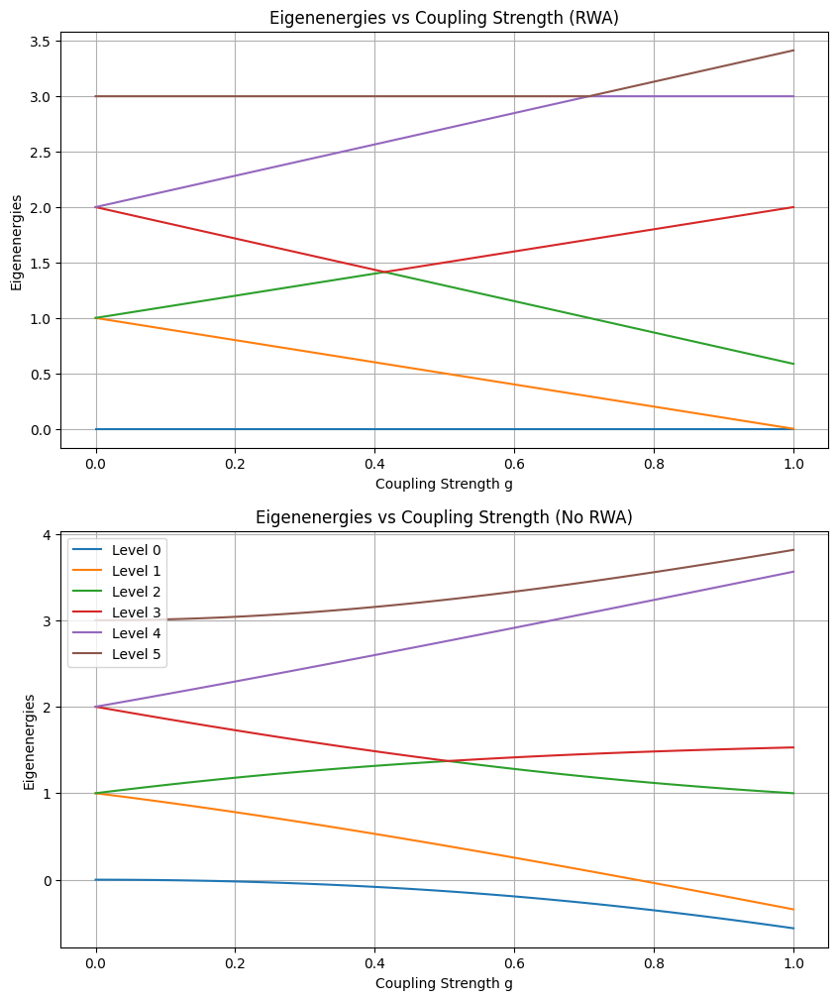

In [ ]:
# Let us plot the energy levels of the jaynes cummings hamiltonian as a function of our chosen varying parameters
import numpy as np
import matplotlib.pyplot as plt
# Let us plot RWA Hamiltonian for varying g (strong coupling)
g_values = np.linspace(0, 1, 100)
eigen_JC_list = []
eiegen_full_list = []
for g in g_values:
    H_JC = HamiltonianJaynesCummings(g, wr, wt, N)
    H_FULL = HamiltonianRabi(g, wr, wt, N)
    eigen_JC = H_JC.eigenenergies()
    eigen_JC_list.append(eigen_JC)
    eigen_Full = H_FULL.eigenenergies()
    eiegen_full_list.append(eigen_Full)
# Plot the eiegen energy levels (with 1 color for each energy level)
plt.figure(figsize=(10, 12))
plt.subplot(2,1,1)
for i in range(2*N):
    plt.plot(g_values, [eigen_JC_list[j][i] for j in range(len(g_values))], label=f'Level {i}')
plt.xlabel('Coupling Strength g')
plt.ylabel('Eigenenergies')
plt.title('Eigenenergies vs Coupling Strength (RWA)')
plt.grid()
plt.subplot(2,1,2)
for i in range(2*N):
    plt.plot(g_values, [eiegen_full_list[j][i] for j in range(len(g_values))], label=f'Level {i}')
plt.xlabel('Coupling Strength g')
plt.ylabel('Eigenenergies')
plt.title('Eigenenergies vs Coupling Strength (No RWA)')
plt.grid()
plt.legend()
plt.show()

We can clearly see that as the coupling factor g gets stronger (stronger coupling, g > 0.4), the RWA eigenergies start to deviate from the rabi hamiltonian eigenergies significantly. 

This was at zero detuning, let us now vary the detuning in an animation plot

In [7]:
# We will plot the same figure as above, just now make an HTML animation to see the variation of these levels with detuning
# Animate the eigenenergy vs g plots for varying detuning (detuning=0 frame matches static plots)
N = 5
g_values = np.linspace(0, 1, 100)
detuning_range = np.linspace(-5, 5, 101)
n_det = len(detuning_range)
n_g = len(g_values)
n_levels = 2 * N

eigen_JC_grid = np.zeros((n_det, n_g, n_levels))
eigen_Rabi_grid = np.zeros_like(eigen_JC_grid)

for i_det, det in enumerate(detuning_range):
    for i_g, gg in enumerate(g_values):
        # hamiltonians with a g gg and detuning det
        H_JC_tmp = HamiltonianJaynesCummings(gg, wr, wt + det, N)
        H_RABI_tmp = HamiltonianRabi(gg, wr, wt + det, N)
        
        eigen_JC_grid[i_det, i_g, :] = np.sort(H_JC_tmp.eigenenergies())[:n_levels]
        eigen_Rabi_grid[i_det, i_g, :] = np.sort(H_RABI_tmp.eigenenergies())[:n_levels]

In [8]:
import matplotlib.animation as animation
from IPython.display import HTML
# Create animation
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
lines_rwa = []
lines_full = []
for i in range(2*N):
    l1, = ax1.plot([], [], label=f'Level {i}')
    l2, = ax2.plot([], [], label=f'Level {i}')
    lines_rwa.append(l1)
    lines_full.append(l2)

ax1.set_xlim(g_values[0], g_values[-1])
ax1.set_ylim(-2, 10)
ax1.set_xlabel('Coupling Strength g')
ax1.set_ylabel('Eigenenergies')
ax1.set_title('Eigenenergies vs Coupling Strength (RWA)')
ax1.legend(loc='upper right', fontsize='small')
ax1.grid()

ax2.set_xlim(g_values[0], g_values[-1])
ax2.set_ylim(-2, 10)
ax2.set_xlabel('Coupling Strength g')
ax2.set_ylabel('Eigenenergies')
ax2.set_title('Eigenenergies vs Coupling Strength (No RWA)')
ax2.legend(loc='upper right', fontsize='small')
ax2.grid()

def update(frame):
    y1 = eigen_JC_grid[frame]   # shape (n_g, n_levels)
    y2 = eigen_Rabi_grid[frame]
    for i in range(n_levels):
        lines_rwa[i].set_data(g_values, y1[:, i])
        lines_full[i].set_data(g_values, y2[:, i])
    fig.suptitle(f'Detuning Δ = {detuning_range[frame]:.3f}')
    return lines_rwa + lines_full

ani = animation.FuncAnimation(fig, update, frames=n_det, blit=True, interval=100)
html_output = ani.to_jshtml()
plt.close(fig)
HTML(html_output)

Discussion: 

We are explicitly truncating the resonator hilbert space to N.